## The Double Pendulum

The expressions for the potential and kinetic energy of the double pendulum can be found in Taylor Chapter 11, Eq. 11.37 and 11.38. The lagrangian can be formed from these equations. The appropriate derivatives can be taken and the equations of motion for the two generalized coordinates $[\phi_1(t),\phi_2(t)]$ can be found. In this notebook I will: 
- Solve the equations of motion without assuming the small angle approximation
- Show for initial conditions outside the small angle approximation lead to chaos
- Animate the double pendulum

## Equations of Motion

From the Lagrangian we can arrive at the equations of motion below. $m_1$ is the mass of the first bob, $m_2$ is the mass of the second bob, $l_1$ is the length of the first pendulum, $l_2$ is the length of the second pendulum.

$\ddot{\phi_1}(t) = -\frac{m_2 l_1 l_2 \ddot{\phi_2}(t) \cos{(\phi_1 - \phi_2)} + (m_1 + m_2) \ g \ l_1 \sin{(\phi_1)} + m_2 l_1 l_2 {\dot{\phi}_2}^2 \sin{(\phi_1 - \phi_2)}}{(m_1 + m_2) \ {l_1}^2}$

$\ddot{\phi_2}(t) = -\frac{m_2 l_1 l_2 \ddot{\phi_1}(t) \cos{(\phi_1 - \phi_2)} + m_2 \ g \ l_2 \sin{(\phi_2)} + m_2 l_1 l_2 {\dot{\phi}_1}^2 \sin{(\phi_1 - \phi_2)}}{m_2 \ {l_2}^2}$

In [3]:
%matplotlib inline

In [4]:
import numpy as np
from scipy.integrate import ode, odeint, solve_ivp

import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

In [5]:
# Change the common font size
font_size = 14
plt.rcParams.update({'font.size': font_size})

## Initialize the Pendulum Class

In [6]:
class Pendulum():
    """
    Pendulum class implements the parameters and differential equation for 
     a pendulum using the notation from Taylor.
     
    Parameters
    ----------
    

    Methods
    -------
    dy_dt(y, t)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y.
    """
    def __init__(self, m_1=1., m_2=1, l_1=1, l_2=1, g=1,
                ):
        self.m_1 = m_1
        self.m_2 = m_2
        self.l_1 = l_1
        self.l_2 = l_2
        self.g = g
    
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dphi_1/dt d^2phi_1/dt^2 dphi_2/dt d^2phi_2/dt^2]
        
        Parameters
        ----------
        y : float
            A 4-component vector with y[0] = phi_1(t), y[1] = dphi_1/dt, y[2] = phi_2(t) and y[3] = dphi_2/dt
        t : float
            time 
            
        Returns
        -------
        
        """
        dy = np.zeros(4)
        dy[0] = y[1]
        dy[1] = -(self.m_2*self.l_1*self.l_2*dy[3]*np.cos(y[0]-y[2]) + (self.m_1 + self.m_2)*self.g*self.l_1*np.sin(y[0]) + self.m_2*self.l_1*self.l_2*y[3]**2 * np.sin(y[0] - y[2]))/((self.m_1 + self.m_2)*self.l_1**2)
        dy[2] = y[3]
        dy[3] = -(self.m_2*self.l_1*self.l_2*dy[1] * np.cos(y[0]-y[2]) + self.m_2*self.g*self.l_2*np.sin(y[2]) + self.m_2*self.l_1*self.l_2* y[1]**2 *np.sin(y[0]-y[2]))/(self.m_2*self.l_2**2)
        return dy
    
    def solve_ode(self, t_pts, phi_1_0, phi_1_dot_0, phi_2_0, phi_2_dot_0,
                  method='RK23',
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Use solve_ivp with the option of specifying the method.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [phi_1_0, phi_1_dot_0, phi_2_0, phi_2_dot_0] 
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, method=method, 
                             atol=abserr, rtol=relerr)
        phi_1, phi_1_dot, phi_2, phi_2_dot   = solution.y
        return phi_1, phi_1_dot, phi_2, phi_2_dot 
    

In [7]:
# Problem parameters
m_1 = 1.
m_2 = 1.
l_1 = 1.
l_2 = 1.
g = 1.

# Time vector
t_start = 0.
t_end = 20.
delta_t = 0.01
t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Get Double Pendulum
p1 = Pendulum(m_1, m_2, l_1, l_2, g)

# Initial conditions
phi_1_0 = -1.
phi_1_dot_0 = 0.
phi_2_0 =  -1.1
phi_2_dot_0 = 0.

phi_1, phi_1_dot, phi_2, phi_2_dot = p1.solve_ode(t_pts, phi_1_0, phi_1_dot_0, phi_2_0, phi_2_dot_0)


## Make figures to show chaos

Plan: Plot generalized coordinates vs time and state space figures to show chaos.


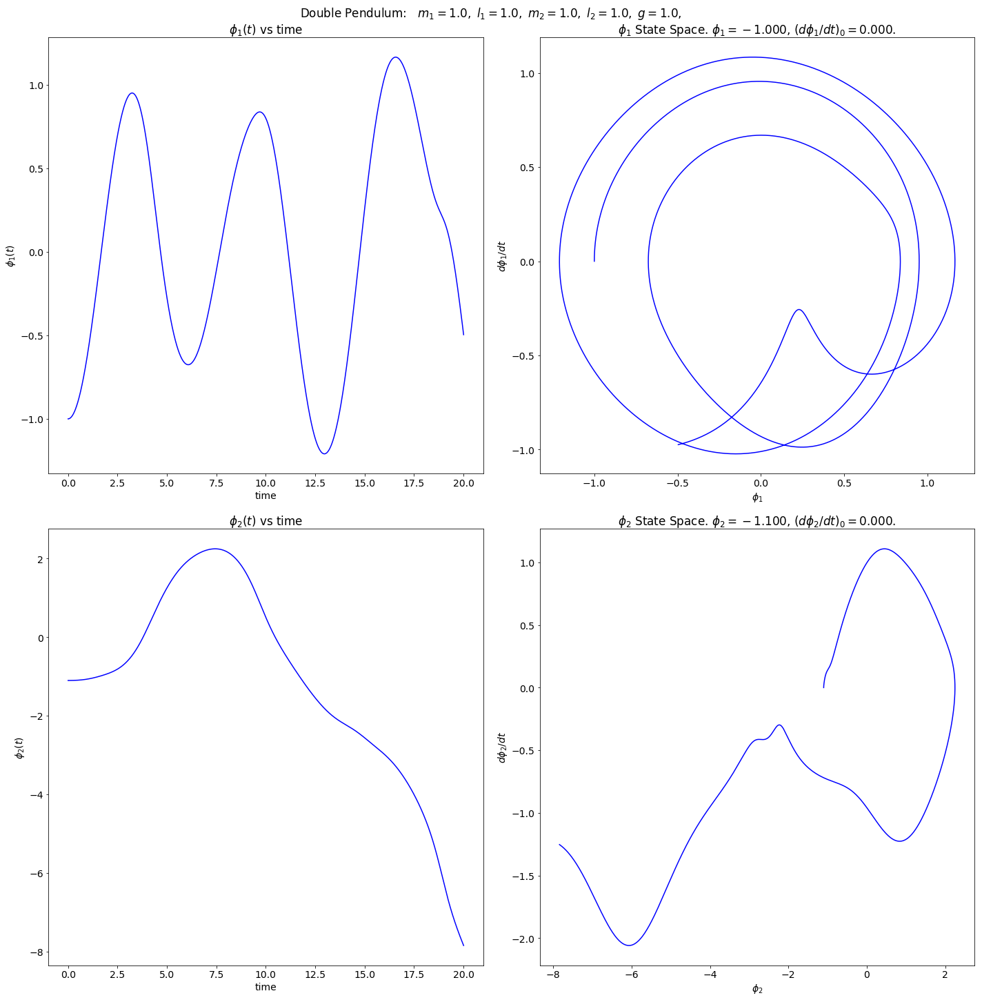

In [8]:
fig = plt.figure(figsize=(20,20))

overall_title = 'Double Pendulum:  ' + \
                rf' $m_1 = {p1.m_1},$' + \
                rf' $l_1 = {p1.l_1},$' + \
                rf' $m_2 = {p1.m_2},$' + \
                rf' $l_2 = {p1.l_2},$' + \
                rf' $g = {p1.g},$' + \
                '\n'     # \n means a new line (adds some space here)
fig.suptitle(overall_title, va='baseline')

ax_4a = fig.add_subplot(2,2,1)
ax_4a.plot(t_pts, phi_1, color='blue')
ax_4a.set_xlabel('time')
ax_4a.set_ylabel('$\phi_1(t)$')
ax_4a.set_title('$\phi_1(t)$ vs time')

ax_4b = fig.add_subplot(2,2,2)
ax_4b.plot(phi_1, phi_1_dot, color='blue')
ax_4b.set_xlabel('$\phi_1$')
ax_4b.set_ylabel('$d \phi_1/dt$')
ax_4b.set_title(rf'$\phi_1$ State Space. $\phi_1 = {phi_1_0:.3f}$, $(d \phi_1/dt)_0 = {phi_1_dot_0:.3f}$.')

ax_4a = fig.add_subplot(2,2,3)
ax_4a.plot(t_pts, phi_2, color='blue')
ax_4a.set_xlabel('time')
ax_4a.set_ylabel('$\phi_2(t)$')
ax_4a.set_title('$\phi_2(t)$ vs time')

ax_4b = fig.add_subplot(2,2,4)
ax_4b.plot(phi_2, phi_2_dot, color='blue')
ax_4b.set_xlabel('$\phi_2$')
ax_4b.set_ylabel('$d \phi_2/dt$')
ax_4b.set_title(rf'$\phi_2$ State Space. $\phi_2 = {phi_2_0:.3f}$, $(d \phi_2/dt)_0 = {phi_2_dot_0:.3f}$.')

fig.tight_layout()

Looks pretty messy.

## Lets Animate!

In [9]:
%%capture

# Get x and y values from phi_1 and phi_2
x1 = l_1*np.sin(phi_1)
y1 = -l_1*np.cos(phi_1)
x2 = x1 + l_2*np.sin(phi_2)
y2 = y1 + -l_2*np.cos(phi_2)

x_min = min([min(x1),min(x2)]) 
y_min = min([min(y1),min(y2)]) 
x_max = max([max(x1),max(x2)]) 
y_max = max([max(y1),max(y2)]) 

gap = 1
fig_anim = plt.figure(figsize=(10,10), num='Double Pendulum... Chaos')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min-gap, x_max+gap)
ax_anim.set_ylim(y_min-gap, y_max+gap)

# By assigning the first return from plot to line_anim, we can later change
#  the values in the line.
line_anim1, = ax_anim.plot([0, x1[0]], [0,y1[0]], color='blue', lw=2)
line_anim2, = ax_anim.plot([x1[0], x2[0]], [y1[0],y2[0]], color='red', lw=2)

fig_anim.tight_layout()

In [10]:
def animate_wave(i):
    """This is the function called by FuncAnimation to create each frame,
        numbered by i.  So each i corresponds to a point in the t_pts
        array, with index i. 
        """

    line_anim1.set_data([0,x1[i]], [0,y1[i]])  # overwrite line_anim with new points
    line_anim2.set_data([x1[i],x2[i]], [y1[i],y2[i]])  # overwrite line_anim with new points
    return (line_anim1, line_anim2)   # this is needed for blit=True to work

In [11]:
frame_interval = 1.  # time between frames
frame_number = 1000 # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animate_wave, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

#fig.show()

In [12]:
HTML(anim.to_jshtml())